In [1]:
from bayes3d.dino import Dino
import bayes3d as b
import os
import torch
import numpy as np
import matplotlib
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import torchvision.transforms as T
import bayes3d.ycb_loader
import bayes3d.o3d_viz
from tqdm import tqdm
import open3d as o3d


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
b.setup_visualizer()

You can open the visualizer by visiting the following URL:
http://127.0.0.1:7007/static/


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dinov2_vitg14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dino = dinov2_vitg14.to(device)  # Same issue with larger model

Using cache found in /home/ubuntu/.cache/torch/hub/facebookresearch_dinov2_main


In [4]:
def get_embeddings(rgbd):
    img = b.get_rgb_image(rgbd.rgb).convert('RGB')
    patch_w, patch_h = np.array(img.size) // 14
    transform = T.Compose([
        T.GaussianBlur(9, sigma=(0.1, 2.0)),
        T.Resize((patch_h * 14, patch_w * 14)),
        T.CenterCrop((patch_h * 14, patch_w * 14)),
        T.ToTensor(),
        T.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ])
    tensor = transform(img)[:3].unsqueeze(0).to(device)
    with torch.no_grad():
        features_dict = dinov2_vitg14.forward_features(tensor)
        features = features_dict['x_norm_patchtokens'][0].reshape((patch_h, patch_w, 1024)).permute(2, 0, 1).unsqueeze(0)
    img_feat_norm = torch.nn.functional.normalize(features, dim=1)
    output = jnp.array(img_feat_norm.cpu().detach().numpy())[0]
    del img_feat_norm
    del features
    del tensor
    del features_dict
    torch.cuda.empty_cache()
    return jnp.transpose(output, (1,2,0))

In [5]:
w,h = 1400,1400
intrinsics = b.Intrinsics(
    height=h,
    width=w,
    fx=2000.0, fy=2000.0,
    cx=w/2.0, cy=h/2.0,
    near=0.001, far=6.0
)
scaled_down_intrinsics = b.camera.scale_camera_parameters(intrinsics, 1.0/14.0)
scaled_down_intrinsics

Intrinsics(height=100, width=100, fx=142.85714285714286, fy=142.85714285714286, cx=50.0, cy=50.0, near=0.001, far=6.0)

In [6]:
b.setup_renderer(scaled_down_intrinsics)

[E rasterize_gl.cpp:121] OpenGL version reported as 4.6


Increasing frame buffer size to (width, height, depth) = (128, 128, 1024)


In [7]:
model_dir = os.path.join(b.utils.get_assets_dir(),"bop/ycbv/models")
mesh_paths = []
for idx in range(1,22):
    mesh_paths.append(os.path.join(model_dir,"obj_" + "{}".format(idx).rjust(6, '0') + ".ply"))
SCALING_FACTOR = 1.0/1000.0
obj_idx = 0


In [8]:
viz = b.o3d_viz.O3DVis(intrinsics)
viz.clear()
mesh_filename = mesh_paths[obj_idx]
mesh = o3d.io.read_triangle_model(mesh_filename)
mesh.meshes[0].mesh.scale(SCALING_FACTOR, np.array([0.0, 0.0, 0.0]))
viz.render.scene.add_model(f"1", mesh)




[Open3D INFO] EGL headless mode enabled.


In [59]:
object_poses = jnp.array([b.t3d.inverse_pose(b.t3d.transform_from_pos_target_up(
            jnp.array([0.0, 0.6, 0.0]),
            jnp.array([0.0, 0.0, 0.0]),
            jnp.array([0.0, 0.0, 1.0]),
        )) @ b.t3d.transform_from_axis_angle(jnp.array([0.0, 0.0, 1.0]), angle)  for angle in np.linspace(-jnp.pi, jnp.pi, 101)[:-1]])
for (i, pose) in enumerate(object_poses):
    b.show_pose(f"{i}", pose)

In [61]:
images = []
for pose in tqdm(object_poses):
    rgbd = viz.capture_image(intrinsics, b.t3d.inverse_pose(pose))
    images.append(rgbd)

# jnp.savez(f"data_{obj_idx}.npz",images=images, camera_poses=camera_poses)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.60it/s]


In [13]:
# data = jnp.load(f"data_{obj_idx}.npz", allow_pickle=True)
# images = data["images"]
# camera_poses = data["camera_poses"]

# Training

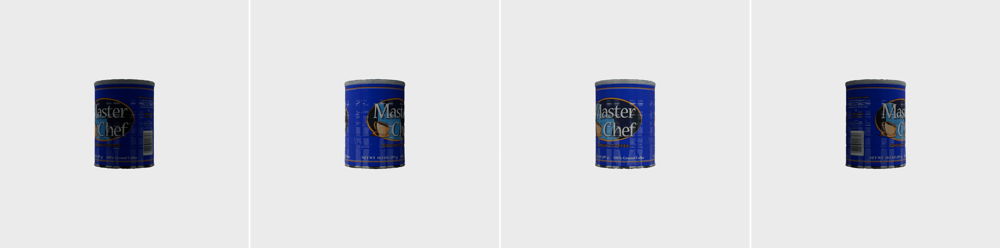

In [62]:
num_images = len(images)
num_training_images = 4
training_indices = jnp.arange(0,num_images-1, num_images // num_training_images)
b.hstack_images([
    b.get_rgb_image(images[idx].rgb) for idx in training_indices
])

In [63]:
keypoint_coordinates = []
keypoint_embeddings = []

for idx in tqdm(training_indices):
    training_image = images[idx]
    object_pose = object_poses[idx]

    scaled_down_training_image = b.scale_rgbd(training_image, 1.0/14.0)
    embeddings = get_embeddings(training_image)
    # del embeddings
    foreground_mask = (jnp.inf != scaled_down_training_image.depth)
    foreground_pixel_coordinates = jnp.transpose(jnp.vstack(jnp.where(foreground_mask)))

    NUM_KEYPOINTS_TO_SELECT = jnp.min(jnp.array([2000,foreground_pixel_coordinates.shape[0]]))
    subset = jax.random.choice(jax.random.PRNGKey(10),foreground_pixel_coordinates.shape[0], shape=(NUM_KEYPOINTS_TO_SELECT,), replace=False)

    depth = jnp.array(scaled_down_training_image.depth)
    depth = depth.at[depth == jnp.inf].set(0.0)
    point_cloud_image = b.t3d.unproject_depth(depth, scaled_down_training_image.intrinsics)

    keypoint_world_coordinates = point_cloud_image[foreground_pixel_coordinates[subset,0], foreground_pixel_coordinates[subset,1],:]
    _keypoint_coordinates = b.t3d.apply_transform(keypoint_world_coordinates, b.t3d.inverse_pose(object_pose))
    _keypoint_embeddings = embeddings[foreground_pixel_coordinates[subset,0], foreground_pixel_coordinates[subset,1],:]
    
    keypoint_coordinates.append(_keypoint_coordinates)
    keypoint_embeddings.append(_keypoint_embeddings)
    del embeddings

keypoint_coordinates = jnp.concatenate(keypoint_coordinates)
keypoint_embeddings = jnp.concatenate(keypoint_embeddings)
print(keypoint_coordinates.shape)
print(keypoint_embeddings.shape)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:06<00:00,  1.72s/it]

(3320, 3)
(3320, 1024)


In [64]:

def render_embedding_image(pose, keypoint_coordinates, keypoint_embeddings):
    point_cloud_img = b.RENDERER.render(pose[None,...], jnp.array([0]))[:,:,:3]
    point_cloud_img_in_object_frame = b.t3d.apply_transform(point_cloud_img, b.t3d.inverse_pose(pose))

    distances_to_keypoints = (
        jnp.linalg.norm(point_cloud_img_in_object_frame[:, :,None,...] - keypoint_coordinates[None, None,:,...],
        axis=-1
    ))
    index_of_nearest_keypoint = distances_to_keypoints.argmin(2)
    distance_to_nearest_keypoints = distances_to_keypoints.min(2)

    DISTANCE_THRESHOLD = 0.04
    valid_match_mask = (distance_to_nearest_keypoints < DISTANCE_THRESHOLD)[...,None]
    selected_keypoints = keypoint_coordinates[index_of_nearest_keypoint]
    rendered_embeddings_image = keypoint_embeddings[index_of_nearest_keypoint] * valid_match_mask
    return point_cloud_img, rendered_embeddings_image

def score_pose(pose, keypoint_coordinates, keypoint_embeddings, observed_embeddings):
    _,rendered_embedding_image = render_embedding_image(pose, keypoint_coordinates, keypoint_embeddings)
    dot_products = jnp.einsum("abi,abi->ab", rendered_embedding_image, observed_embeddings)
    return dot_products.mean()

def get_pca(embeddings):
    features_flat = torch.from_numpy(np.array(embeddings).reshape(-1, embeddings.shape[-1]))
    U, S, V = torch.pca_lowrank(features_flat - features_flat.mean(0), niter=10)
    proj_PCA = jnp.array(V[:, :3])
    return proj_PCA

def get_colors(features, proj_V):
    features_flat = features.reshape(-1, features.shape[-1])
    feat_rgb = features_flat @ proj_V
    feat_rgb = (feat_rgb + 1.0) / 2.0
    feat_rgb = feat_rgb.reshape(features.shape[:-1] + (3,))
    return feat_rgb

score_pose_parallel_jit = jax.jit(jax.vmap(score_pose, in_axes=(0, None, None, None)))

In [65]:
import meshcat.geometry as g

proj_V = get_pca(keypoint_embeddings)
colors = get_colors(keypoint_embeddings, proj_V)
b.clear()
obj = g.PointCloud(np.transpose(keypoint_coordinates)*10.0, np.transpose(colors), size=0.1)
b.meshcatviz.VISUALIZER["2"].set_object(obj)

In [66]:
b.setup_renderer(scaled_down_training_image.intrinsics)
b.RENDERER.add_mesh_from_file(mesh_filename, scaling_factor=SCALING_FACTOR)
b.setup_renderer(scaled_down_training_image.intrinsics)
b.RENDERER.add_mesh_from_file(mesh_filename, scaling_factor=SCALING_FACTOR)

[E rasterize_gl.cpp:121] OpenGL version reported as 4.6
[E rasterize_gl.cpp:121] OpenGL version reported as 4.6


Increasing frame buffer size to (width, height, depth) = (128, 128, 1024)
Increasing frame buffer size to (width, height, depth) = (128, 128, 1024)


In [85]:
IDX = 50
test_rgbd = images[IDX]
observed_embeddings = get_embeddings(test_rgbd)
# b.get_rgb_image(test_rgbd.rgb)

In [86]:
posterior = jnp.concatenate([score_pose_parallel_jit(i,  keypoint_coordinates, keypoint_embeddings, observed_embeddings) for i in jnp.array_split(object_poses, 10)])
print(posterior.argmax())
best_pose = possible_object_poses[posterior.argmax()]
print(best_pose)

50
[[-1.000000e+00 -4.440892e-16 -0.000000e+00 -0.000000e+00]
 [-0.000000e+00 -0.000000e+00 -1.000000e+00 -0.000000e+00]
 [ 4.440892e-16 -1.000000e+00 -0.000000e+00  6.000000e-01]
 [ 0.000000e+00  0.000000e+00  0.000000e+00  1.000000e+00]]


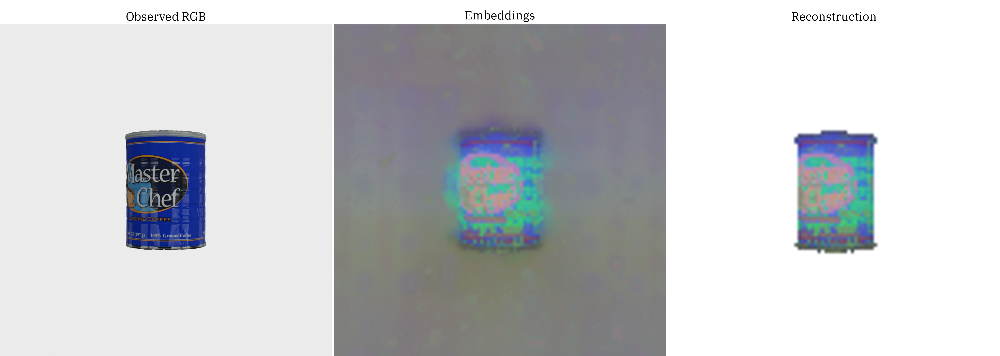

In [87]:
observed_embedding_colors = get_colors(observed_embeddings, proj_V)
observed_embeddings_image_viz = b.get_rgb_image(observed_embedding_colors * 255.0)

pc_img, rendered_embedding_image = render_embedding_image(best_pose, keypoint_coordinates, keypoint_embeddings)
colors = get_colors(rendered_embedding_image, proj_V)
rgba = jnp.array(b.get_rgb_image(colors * 255.0))
rgba = rgba.at[pc_img[:,:,2] > intrinsics.far - 0.01, :3].set(255.0)
rerendered_embeddings_viz = b.get_rgb_image(rgba)

b.multi_panel([
    b.get_rgb_image(test_rgbd.rgb), 
    b.scale_image(observed_embeddings_image_viz, 14.0),
    b.scale_image(rerendered_embeddings_viz, 14.0)
],labels=[
    "Observed RGB",
    "Embeddings",
    "Reconstruction"
],label_fontsize=50
)